In [ ]:
import os
api_key = os.environ["MISTRAL_API_KEY"]

In [53]:
import io
import base64
from PIL import Image
from mistralai import Mistral

def upload_file_to_mistral(file_path, api_key):
    client = Mistral(api_key=api_key)

    uploaded_pdf = client.files.upload(
        file={
            "file_name": file_path,
            "content": open(file_path, "rb"),
        },
        purpose="ocr"
    )

    signed_url = client.files.get_signed_url(file_id=uploaded_pdf.id)
    return signed_url

def get_ocr_response(signed_url, api_key):
    client = Mistral(api_key=api_key)

    ocr_response = client.ocr.process(
        model="mistral-ocr-latest",
        document={
            "type": "document_url",
            "document_url": signed_url.url,
        },
        include_image_base64=True
    )
    return ocr_response

def get_images_from_ocr_response(ocr_response):
    cropped_imgs = []
    markdowns = [] 

    for page in ocr_response.pages:
        markdowns.append(page.markdown)
        
        for image in page.images:
            image_bytes = base64.b64decode(image.image_base64.split(",")[1])
            image = Image.open(io.BytesIO(image_bytes))
            cropped_imgs.append(image)
                        
    return markdowns, cropped_imgs

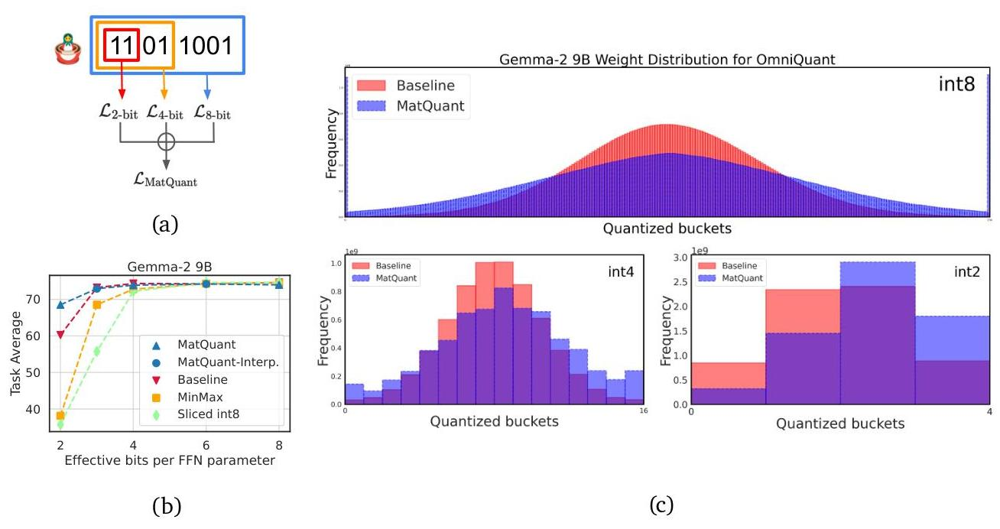

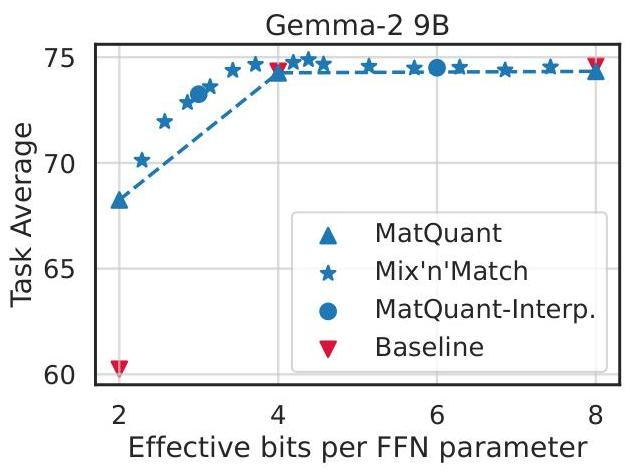

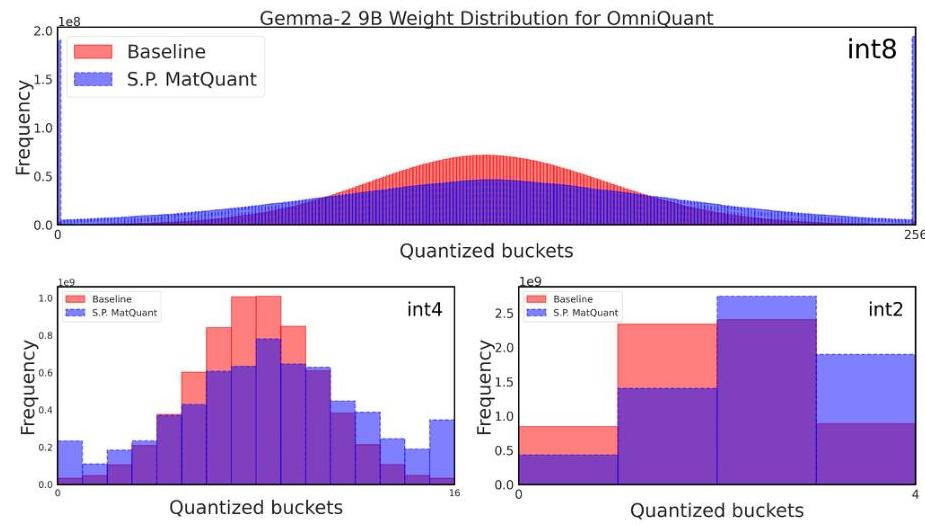

In [54]:
url = upload_file_to_mistral("Matryoshka Quantization.pdf", api_key)
ocr_response = get_ocr_response(url, api_key)
markdowns, images = get_images_from_ocr_response(ocr_response)
for image in images:
    display(image)


In [59]:
from IPython.display import Markdown

for markdown in markdowns:
    display(Markdown(markdown))
    break

# Matryoshka Quantization 

Pranav Nair ${ }^{*, 1}$, Puranjay Datta ${ }^{*, 1}$, Jeff Dean ${ }^{1}$, Prateek Jain ${ }^{1}$ and Aditya Kusupati ${ }^{1}$<br>${ }^{1}$ Google DeepMind, ${ }^{2}$ Equal contribution

Quantizing model weights is critical for reducing the communication and inference costs of large models. However, quantizing models - especially to low precisions like int4 or int2 - requires a trade-off in model quality; int2, in particular, is known to severely degrade model quality. Consequently, practitioners are often forced to maintain multiple models with different quantization levels or serve a single model that best satisfies the quality-latency trade-off. On the other hand, integer data types, such as int8, inherently possess a nested (Matryoshka) structure where smaller bit-width integers, like int4 or int2, are nested within the most significant bits. This paper proposes Matryoshka Quantization (MatQuant), a novel multi-scale quantization technique that addresses the challenge of needing multiple quantized models. It allows training and maintaining just one model, which can then be served at different precision levels. Furthermore, due to the co-training and co-distillation regularization provided by MatQuant, the int2 precision models extracted by MatQuant can be up to $10 \%$ more accurate than standard int2 quantization (using techniques like QAT or OmniQuant). This represents significant progress in model quantization, demonstrated by the fact that, with the same recipe, an int2 FFN-quantized Gemma-2 9B model is more accurate than an int8 FFN-quantized Gemma-2 2B model.

## 1. Introduction

Due to their impressive performance, there is a strong push to deploy deep learning models, particularly large language models (LLMs) (Achiam et al., 2023; Dubey et al., 2024; G Team et al., 2024) in a large number of scenarios. Due to autoregressive nature of LLMs, decode latency tends to dominate inference cost. Decode latency itself is dominated by communication cost of transferring model weights from high-bandwidth memory (HBM) to the SRAM or due to transferring weights/activations in a distributed cluster.

Quantizing weights and/or activations can significantly reduce the overall communication load and is, therefore, one of the most popular techniques for reducing inference costs (Dettmers et al., 2022). While floating-point representations are standard for training, integer data types such as int8, int4, and int2 are appealing alternatives for inference. However, current methods for quantizing to these varying integer precisions typically treat each target precision as an independent optimization problem, leading to a collection of distinct models rather than a single, versatile one. Furthermore, quantizing to extremely low precisions like int2 is known to be highly inaccurate.

In this work, we pose the question of whether both of the above challenges can be addressed; that is, can we train a single model from which we can extract multiple accurate lower-precision models? We answer this question in the affirmative by introducing Matryoshka Quantization (MatQuant), a novel multi-scale training method that leverages the inherent nested (Matryoshka) structure (Kusupati et al., 2022) within integer data types (Figure 1a). Specifically, slicing the top bits of an int8-quantized weight can directly yield an int4 or int2 model. Existing quantization techniques often neglect this structure, which limits the potential for multi-scale adaptable models operating at various bit-widths with optimal performance.

Instead, MatQuant simultaneously optimizes model weights across multiple precision levels (e.g., int8, int4, int2). At a high level, we represent each model parameter at different precision levels using shared most significant bits (MSBs), and then jointly optimize the loss for each precision level. This allows us to develop a single quantized model that can effectively operate at any of the chosen bit-widths, offering a spectrum of accuracy-versus-cost options. MatQuant is a general-purpose technique, applicable to most

In [60]:
display(Markdown(markdowns[-1]))

Table 21 | Table presents downstream evaluation and perplexity results for Single Precison MatQuant, comparing it with MatQuant and the Baseline for int2, int4, int8 quatization of Gemma-2 9B with OmniQuant. Note that the model was trained with Single Precison MatQuant for int2, the int4 and int8 model were sliced post training.

| Gemma-2 9B |  |  |  |  |  |  |  |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
| Data type | Method | ARC-c | ARC-e | BoolQ | HellaSwag | PIQA | Winogrande | Average | log pplx. |
| int8 | S.P. MatQuant | 56.48 | 76.85 | 73.36 | 74.87 | 80.74 | 66.77 | 71.51 | 2.525 |
|  | OmniQuant | 59.47 | 77.31 | 83.94 | 77.35 | 81.39 | 68.11 | 74.59 | 2.418 |
|  | MatQuant | 58.11 | 78.03 | 83.27 | 76.17 | 81.18 | 67.09 | 73.97 | 2.451 |
| int4 | S.P. MatQuant | 57.17 | 77.02 | 74.28 | 74.41 | 80.69 | 67.56 | 71.85 | 2.543 |
|  | OmniQuant | 58.79 | 78.37 | 83.55 | 76.71 | 81.45 | 67.09 | 74.33 | 2.451 |
|  | MatQuant | 57.25 | 77.36 | 84.86 | 75.52 | 81.5 | 66.77 | 73.88 | 2.481 |
| int2 | S.P. MatQuant | 49.74 | 74.66 | 80.92 | 66.57 | 76.06 | 63.54 | 68.58 | 2.857 |
|  | OmniQuant | 39.16 | 63.43 | 72.11 | 52.24 | 72.63 | 61.88 | 60.24 | 3.292 |
|  | MatQuant | 48.72 | 72.18 | 79.2 | 68.11 | 76.17 | 66.77 | 68.52 | 2.809 |

Table 22 | Table presents downstream evaluation and perplexity results for Single Precison MatQuant, comparing it with MatQuant and the Baseline for int2, int4, int8 quatization of Gemma-2 9B with QAT. Note that the model was trained with Single Precison MatQuant for int2, the int4 and int8 model were sliced post training.

|  |  |  |  |  |  |  |  |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
| Data type | Method | ARC-c | ARC-e | BoolQ | HellaSwag | PIQA | Winogrande | Average | log pplx. |
| int8 | S.P. MatQuant | 55.97 | 76.18 | 80.09 | 75.43 | 80.69 | 68.9 | 72.88 | 2.429 |
|  | QAT | 47.78 | 70.66 | 75.08 | 69.92 | 78.35 | 65.11 | 67.82 | 2.29 |
|  | MatQuant | 46.25 | 71.21 | 75.6 | 69.97 | 78.4 | 64.64 | 67.68 | 2.301 |
| int4 | S.P. MatQuant | 55.2 | 76.01 | 74.74 | 74.19 | 80.41 | 68.9 | 71.57 | 2.429 |
|  | QAT | 46.16 | 71.59 | 73.73 | 68.72 | 78.62 | 63.38 | 67.03 | 2.324 |
|  | MatQuant | 44.37 | 70.45 | 75.81 | 68.43 | 78.35 | 64.88 | 67.05 | 2.332 |
| int2 | S.P. MatQuant | 41.21 | 66.2 | 65.02 | 64.31 | 76.06 | 62.35 | 62.53 | 2.706 |
|  | QAT | 33.45 | 55.43 | 62.26 | 54.8 | 70.51 | 59.67 | 56.02 | 2.923 |
|  | MatQuant | 39.85 | 65.66 | 65.93 | 64.08 | 75.68 | 62.75 | 62.32 | 2.756 |

Table 23 | Table presents downstream evaluation and perplexity results for Single Precison MatQuant, comparing it with MatQuant and the Baseline for int2 quatization of Mistral 7B with OmniQuant and QAT.

| int2 |  |  |  |  |  |  | Mistral 7B |  |  |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
|  | Method | ARC-c | ARC-e | BoolQ |  | HellaSwag | PIQA | Winogrande | Task Avg. | log pplx. |  |
| OmniQuant | S.P. MatQuant | 39.93 | 66.25 | 76.97 |  | 72.99 | 78.07 | 69.93 | 67.36 | 2.464 |  |
|  | Baseline | 36.69 | 61.36 | 70.06 |  | 57.47 | 70.67 | 62.19 | 59.74 | 3.931 |  |
|  | MatQuant | 41.38 | 67.42 | 71.62 |  | 71.98 | 77.86 | 65.67 | 65.99 | 2.569 |  |
| QAT | S.P. MatQuant | 34.64 | 56.19 | 70.73 |  | 66.77 | 75.52 | 65.43 | 61.55 | 2.435 |  |
|  | Baseline | 29.78 | 48.23 | 64.5 |  | 55.11 | 70.84 | 61.25 | 54.95 | 2.694 |  |
|  | MatQuant | 34.3 | 55.09 | 71.83 |  | 65.89 | 75.52 | 65.11 | 61.29 | 2.474 |  |

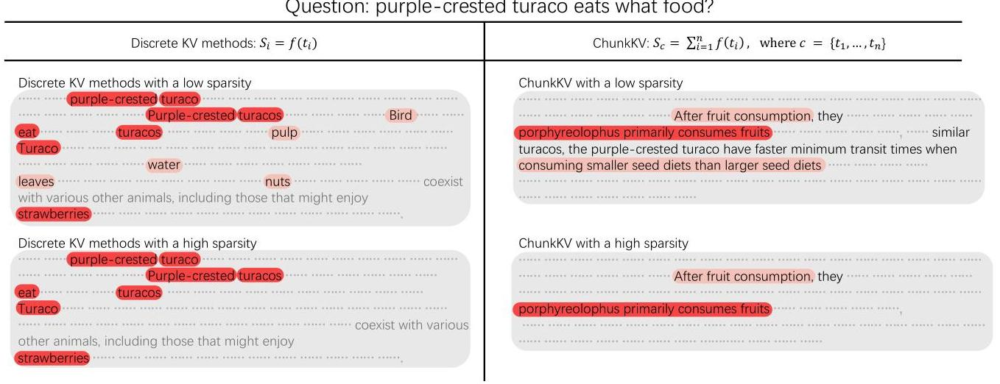

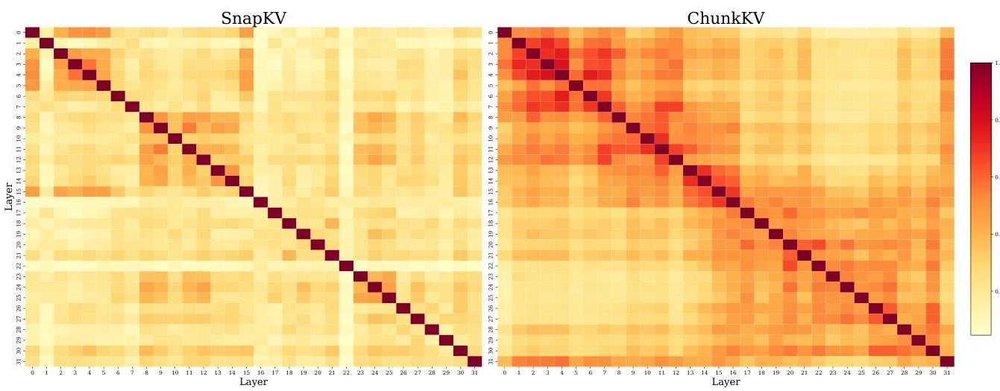

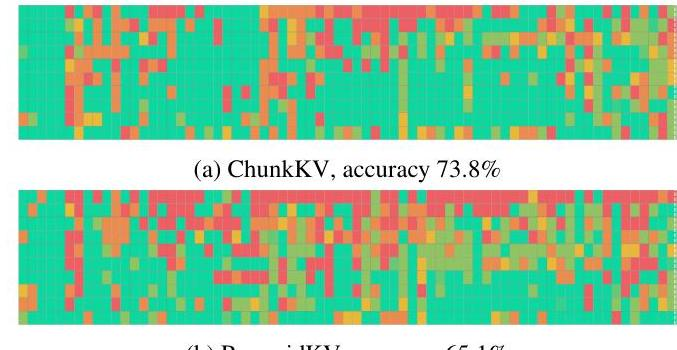

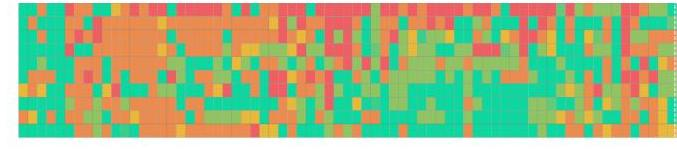

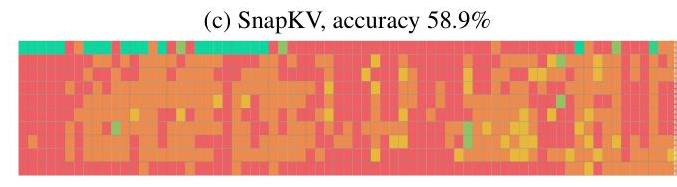

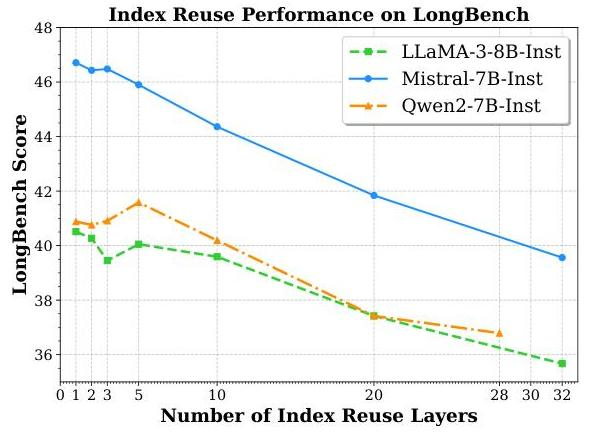

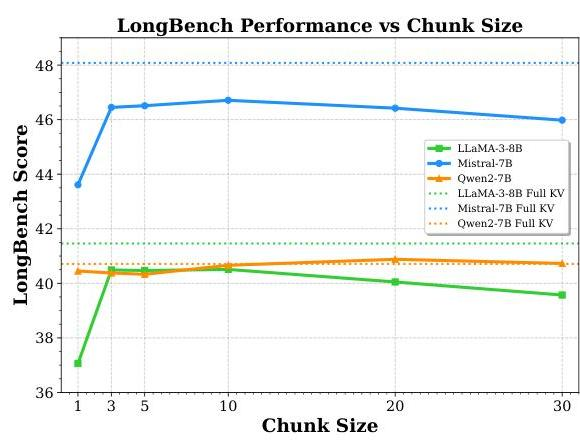

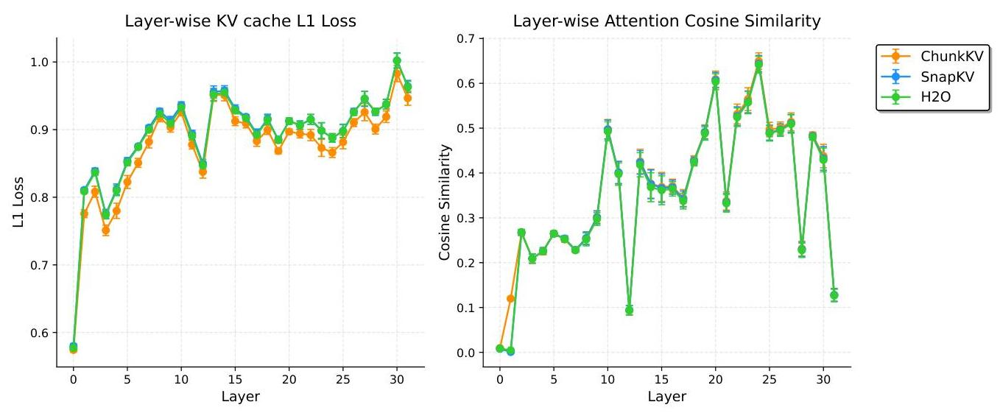

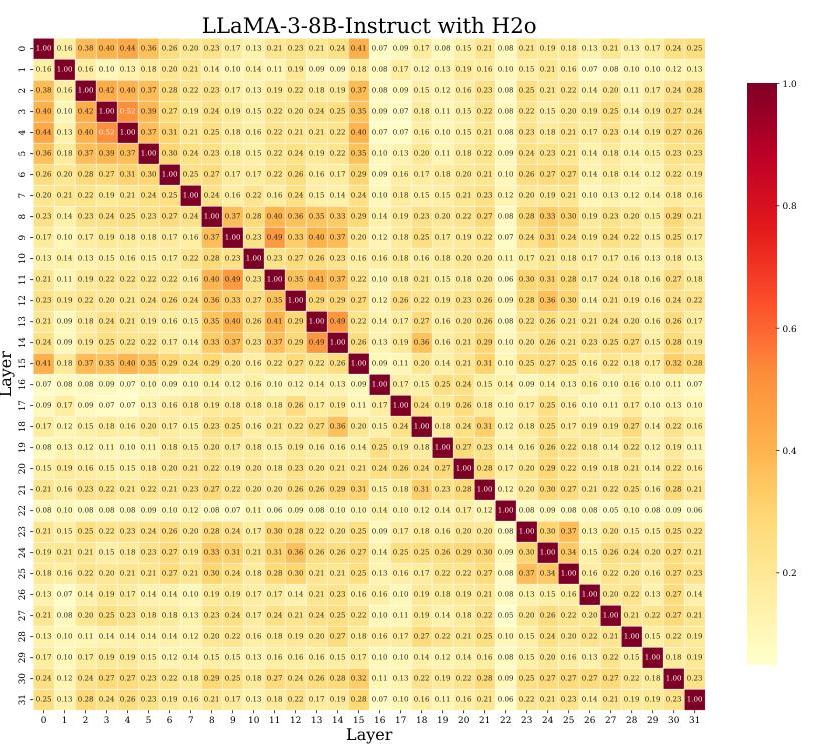

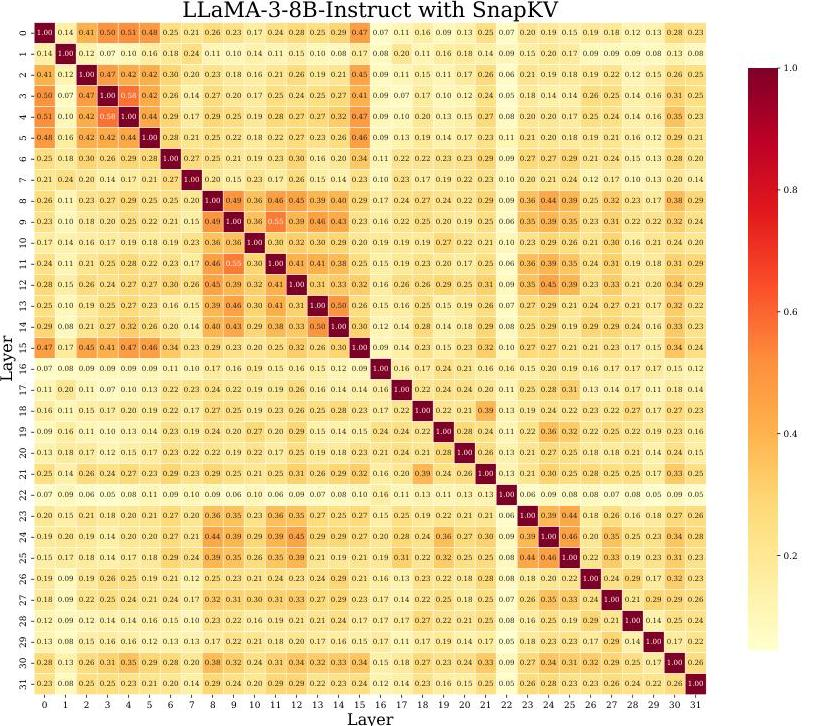

In [65]:
url = upload_file_to_mistral("ChunkKV - Semantic-Preserving KV Cache Compression for Efficient Long-Context LLM Inference.pdf", api_key)
ocr_response = get_ocr_response(url, api_key)
markdowns, images = get_images_from_ocr_response(ocr_response)
for image in images[:10]:
    display(image)

In [62]:
from IPython.display import Markdown

for markdown in markdowns:
    display(Markdown(markdown))
    break

# ChunkKV: Semantic-Preserving KV Cache Compression for Efficient Long-Context LLM Inference 

Xiang Liu ${ }^{1}$ Zhenheng Tang ${ }^{2}$ Peijie Dong ${ }^{1}$ Zeyu Li ${ }^{1}$ Bo Li ${ }^{2}$ Xuming $\mathbf{H u}^{1}$ Xiaowen Chu ${ }^{1}$


#### Abstract

To reduce memory costs in long-context inference with Large Language Models (LLMs), many recent works focus on compressing the key-value (KV) cache of different tokens. However, we identify that the previous KV cache compression methods measure token importance individually, neglecting the dependency between different tokens in the real-world language characterics. In light of this, we introduce ChunkKV, grouping the tokens in a chunk as a basic compressing unit, and retaining the most informative semantic chunks while discarding the less important ones. Furthermore, observing that ChunkKV exhibits higher similarity in the preserved indices across different layers, we propose layer-wise index reuse to further reduce computational overhead. We evaluated ChunkKV on cutting-edge long-context benchmarks including LongBench and Needle-In-A-HayStack, as well as the GSM8K and JailbreakV in-context learning benchmark. Our experiments with instruction tuning and multi-step reasoning (O1 and R1) LLMs, achieve up to 10\% performance improvement under aggressive compression ratios compared to existing methods.


## 1. Introduction

Large Language Models (LLMs) have become essential for addressing various downstream tasks of natural language processing (NLP), including summarization and question answering, which require the interpretation of a long context from sources such as books, reports, and documents, often encompassing tens of thousands of tokens (Brown et al., 2020; Tay et al., 2022; Touvron et al., 2023). Recent advances in long-context technology within the field of

[^0]machine learning (ML) systems (Dao, 2024; Jacobs et al., 2023; Xiao et al., 2024) have significantly enhanced computational throughputs and reduced latency of LLMs to process increasingly large input context lengths (Liu et al., 2024b; Young et al., 2024) with saving historical KV cache (key value attentions). However, the memory requirement of the KV cache in serving super-long contexts becomes a new bottlneck (Zhang et al., 2023; Reid et al., 2024). For instance, the KV cache for a single token in a 7B-parameter model requires approximately 0.5 MB of GPU memory, resulting in a 10,000 -token prompt consuming around 5 GB of GPU memory.

To address the substantial GPU memory consumption caused by KV caching, recent studies consider compressing the KV cache by pruning non-important discrete parts from the prompt tokens (Zhang et al., 2023; Li et al., 2024; Ge et al., 2023; Cai et al., 2024; Fu et al., 2024a; Yang et al., 2024b; Liu et al., 2024e; Tang et al., 2024). H2O (Zhang et al., 2023) and SnapKV (Li et al., 2024) have shown that retaining less than $50 \%$ of the discrete KV cache can significantly reduce GPU memory usage with minimal impact on performance. However, we identify that the previous KV cache compression methods (Zhang et al., 2023; Cai et al., 2024) measure token importance isolatedly, neglecting the dependency between different tokens in the real-world language characterics. For example, as shown in Figure 1, focusing on token-level importance might excessively focus on words about subjects "turaco" in the question while omitting crucial information about the objects (foods) in the documents, resulting the loss of essential semantic information. This motivates us to rethink the following question:

How to avoid isolated token importance measurement and preserve the semantic information in KV cache?

In light of this, we observe that the complete semantic information usually appear in a continuous sequence (Fang \& Xie, 2022). Thus, we introduce a straightforward yet effective ChunkKV, grouping the tokens in a chunk as a basic compressing unit, which should be preserved or discarded as a whole. Thus, it retains the most informative semantic chunks from the original KV cache. As shown in Figure 1, preserving a chunk helps to catch the subject, predicate, and object. Furthermore, we investigate that the preserved


[^0]:    ${ }^{1}$ The Hong Kong University of Science and Technology(Guangzhou), Guangzhou, China ${ }^{2}$ The Hong Kong University of Science and Technology, Hong Kong, China. Correspondence to: Xuming Hu [xuminghu@hkust-gz.edu.cn](mailto:xuminghu@hkust-gz.edu.cn), Xiaowen Chu [xwchu@hkust-gz.edu.cn](mailto:xwchu@hkust-gz.edu.cn).

In [64]:
display(Markdown(markdowns[2]))

reasoning (O1 and R1) LLMs, achieving state-of-the-art performance.

## 2. Related Work

KV Cache Compression. KV cache compression technology has developed rapidly in the era of LLM, with methods mainly focused on evicting unimportant tokens. The compression process occurs before the attention blocks, optimizing both the prefilling time and GPU memory. Xiao et al. (2024) and Han et al. (2024) propose that initial and recent tokens consistently have high attention scores between different layers and attention heads. As a result, retaining these tokens in the KV cache is more likely to preserve important information. Furthermore, FastGen (Ge et al., 2023) evicts tokens based on observed patterns. H2O (Zhang et al., 2023) and SnapKV (Li et al., 2024) employ dynamic KV cache compression methods, evaluating the importance of tokens based on attention scores and then evicting the less important ones. As inference scenarios become increasingly complex, dynamic KV cache compression methods demonstrate powerful performance. Recently, Yang et al. (2024b) and Cai et al. (2024) have closely examined the distributions of attention scores during the pre-filling stage of the Retrieval-Augmented Generation (RAG) task, discovering a pyramidal KV cache compression pattern in different transformer layers.

Although these KV cache compression methods have explored efficient GPU memory management while maintaining original performance, our study focuses more on the semantic information of the prompt. We find that chunks of the original KV cache are more important than discrete tokens.

Chunking Method. The chunking methodology is widely used in the field of NLP due to its simplicity and effectiveness (Tjong Kim Sang \& Veenstra, 1999). In the era of LLMs, chunking is primarily applied in data pre-processing. For example, Shi et al. suggest grouping related training data into chunks to achieve better convergence curves to pre-train LLMs. Fei et al. (2024) apply a topic-based chunking method to improve the semantic compression of prompts. Furthermore, chunking plays an important role in the Retrieval-Augmented Generation (RAG) field (Yepes et al., 2024; Smith \& Troynikov, 2024; Anthropic, 2024). It serves to divide documents into units of information with semantic content suitable for embedding-based retrieval and processing by LLMs.

Layer-Wise Technique The layer-wise technique is widely used in the training and inference of large language models (LLMs). LISA (Pan et al., 2024a) is a layer-wise sampling method based on observations of the training dynamics of Low-Rank Adaptation (LoRA)(Hu et al., 2022) across lay-
ers. LAMB(You et al., 2020) is a layer-wise adaptive learning rate method that speeds up LLM training by stabilizing training convergence with large batch sizes. DoLa (Chuang et al., 2023) employs layer-wise contrasting to reduce hallucinations during LLM inference.

## 3. ChunkKV

### 3.1. Preliminary Study of KV Cache Compression

With the increasing long-context capabilities of LLMs, the KV cache has become crucial for improving inference efficiency. However, it can consume significant GPU memory when handling long input contexts. The GPU memory cost of the KV cache for the decoding stage can be calculated as follows:

$$
M_{K V}=2 \times B \times S \times L \times N \times D \times 2
$$

where $B$ is the batch size, $S$ is the sequence length of prompt and decoded length, $L$ is the number of layers, $N$ is the number of attention heads, $D$ is the dimension of each attention head, and the first 2 accounts for the KV matrices, while the last 2 accounts for the precision when using float16. Table E shows the configuration parameters for LLaMA-3-8B-Instruct (Meta, 2024). With a batch size $B=1$ and a sequence length of prompt $S=2048$, the GPU memory cost of the KV cache is nearly 1 GB . If the batch size exceeds 24 , the GPU memory cost of the KV cache will exceed the capacity of an RTX 4090 GPU. To address this issue, KV cache compression methods have been proposed, with the aim of retaining only a minimal amount of KV cache while preserving as much information as possible. For more details on the LLM configuration parameters, refer to Appendix E.

### 3.2. Chunk Based KV Compression

To address the limitations of existing KV cache compression methods, we propose ChunkKV, a novel KV cache compression method that retains the most informative semantic chunks. The key idea behind ChunkKV is to group tokens in the KV cache into chunks that preserve more semantic information, such as a chunk containing a subject, verb and object. As illustrated in Figure 1, ChunkKV preserves the chunks of the KV cache that contain more semantic information. First, we define a chunk as a group of tokens that contain related semantic information. By retaining the most informative chunks from the original KV cache, ChunkKV can effectively reduce the memory usage of the KV cache while preserving essential information.

The Algorithm 1 shows the pseudocode outline of ChunkKV. First, following H2O (Zhang et al., 2023) and SnapKV (Li et al., 2024), we set the observe window by computing the observation scores $\mathbf{A} \leftarrow \mathbf{Q}_{T_{q}-w: T_{q}} \mathbf{K}^{T}$, where $\mathbf{Q}_{T_{q}-w: T_{q}}$